## Introduction

For this notebook we will use a dedicated environment called "l2rpn_neurips_2020_track1", that has 36 substations. Grid2op comes with many different environments, with different problems etc. In this notebook, we will only mention and explain this specific environment.

The approach in this notebook is a loss minimization approach. We have used SARSA algorithm with Q-learning network and this new approach is called Deep SARSA Algorithm.

The algoritm takes current action $a$ with $\epsilon$-greedy algorithm on current state $S$. The reward $r$ and next state $S'$ is observed.

Later the current state $S$, current action $a$, reward $r$ and next state $S'$ is stored in buffer replay memory. The main idea behind the buffer replay memory is to train q-network on the experiences. The q-network will calculate q-values based on these experiences $Q(S,a)$.

A copy of q-network is used as target network to calculate the q-values of next action $a'$ on next state $S'$ where the $a'$ is selected using $\epsilon$-greedy algorithm. The idea behind this network is that it will predict next q-values $\hat{Q}(S',a')$ based on next actions $a'$ predicted by $\epsilon$-greedy algorithm and the next states $S'$. These q-values are then used to calculate next state-action values as $r+\gamma.\hat{Q}(S',a')$ which are then used to calculate loss function.

The loss function that we used is mean square error loss (MSE) which is calculated as $L = \frac{1}{|K|}\sum_{i=1}^{|K|}[(r+\gamma.\hat{Q}(S',a'))-Q(S,a)]^2$ Deep SARSA Algorithm will try to minimise this loss by adjusting the weights of the q-network accordingly.

The Structure of this notebook is as follows:
1. Importing necessary Libraries
2. Preprocess environment
3. Process replay memory
4. Create Deep SARSA Agent
5. Evaluate Agent

## Import necessary libraries

In [2]:
import grid2op
import random
import copy
import gym
import numpy as np
import torch
import torch.nn.functional as F

import matplotlib.pyplot as plt

from typing import Callable
import os

from torch import nn as nn
from torch.optim import AdamW
from tqdm import tqdm

from grid2op.Agent import BaseAgent
from grid2op.gym_compat import GymEnv, BoxGymObsSpace, DiscreteActSpace
from gym import Env
from gym.utils.env_checker import check_env
from grid2op.PlotGrid import PlotMatplot
from utils import plot_cost_to_go, plot_max_q, test_agent, plot_stats, seed_everything    
%matplotlib notebook

## Preprocess environment
This class will make the gym environment compatible with pytorch library

In [3]:
class PreprocessEnv(gym.Wrapper):
    
    def __init__(self, env):
        gym.Wrapper.__init__(self, env)
    
    def reset(self):
        obs = self.env.reset()
        return torch.from_numpy(obs).unsqueeze(dim=0).float()
    
    def step(self, action):
        action = action.item()
        next_state, reward, done, info = self.env.step(action)
        next_state = torch.from_numpy(next_state).unsqueeze(dim=0).float()
        reward = torch.tensor(reward).view(1, -1).float()
        done = torch.tensor(done).view(1, -1)
        return next_state, reward, done, info

## Process replay memory

This helper class will create replay memory and provides functions to insert data into the memory and sample the memory into custom batch sizes

In [4]:
class ReplayMemory:

    def __init__(self, capacity=1000000):
        self.capacity = capacity
        self.memory = []
        self.position = 0

    def insert(self, transition):
        if len(self.memory) < self.capacity:
            self.memory.append(None)
        self.memory[self.position] = transition
        self.position = (self.position + 1) % self.capacity

    def sample(self, batch_size):
        assert self.can_sample(batch_size)

        batch = random.sample(self.memory, batch_size)
        batch = zip(*batch)
        return [torch.cat(items) for items in batch]

    def can_sample(self, batch_size):
        return len(self.memory) >= batch_size * 10

    def __len__(self):
        return len(self.memory)

In [5]:
# DATA_PATH = './training_data_track1'  # for demo only, use your own dataset
# SCENARIO_PATH = './training_data_track1/chronics'

# try:
#     # if lightsim2grid is available, use it.
#     from lightsim2grid import LightSimBackend
#     backend = LightSimBackend()
#     env = grid2op.make(dataset=DATA_PATH, chronics_path=SCENARIO_PATH, backend=backend)
# except:
#     env = grid2op.make(dataset=DATA_PATH, chronics_path=SCENARIO_PATH)

## Create Deep SARSA Agent
This class will create the deep sarsa agent. To run it for any environment it needs either environment name if it is present in grid2op environment list or data path and chronics path of any grid2op compatible environment. Based on number of iterations and number of episodes the run time may vary. 

In [6]:
class DeepSarsaAgent(BaseAgent):
    
    def __init__(self, load_state=False, env_name=None, data_path=None, chronics_path=None):
        if env_name is None and data_path is None and chronics_path is None:
            raise RuntimeError("Environment must be passed, you can pas env_name or data_path and chronics_path")
        if env_name is not None:
            data_path=None
            chronics_path=None
            env = grid2op.make(env_name)
        if data_path is not None and chronics_path is not None:
            env_name=None
            env = grid2op.make(dataset=data_path, chronics_path=chronics_path)
        self.load_state = load_state
        self.model_path = './nn_model'
        if not os.path.exists(self.model_path):
            os.makedirs(self.model_path)
#         self.episodes = episodes
        self.gym_env = GymEnv(env)
        self.gym_env.observation_space = BoxGymObsSpace(env.observation_space, attr_to_keep=["gen_p", "load_p", "topo_vect", "rho"])
        self.gym_env.action_space = DiscreteActSpace(env.action_space, attr_to_keep=["set_bus" , "change_bus", "change_line_status", "set_line_status", "set_line_status_simple"])
        self.state_dims = self.gym_env.observation_space.shape[0]
        self.num_actions = self.gym_env.action_space.n
        
        self.prepo_gym_env = PreprocessEnv(self.gym_env)
        self.batch_size = 10
        self.gamma = 0.99
        self.q_network = self.q_network_def()
        self.target_q_network = self.target_network()
        self.optim = AdamW(self.q_network.parameters(), lr=0.001) #optimiser to optimise weight calculation of neural networks
        self.memory = ReplayMemory() #Initialising memory to store State, Action, Reward, and Next State
        self.stats = {'MSE Loss': [], 'Returns': []} #Dict to store statistics
        
    
    def q_network_def(self):
        q_network = nn.Sequential(nn.Linear(self.state_dims, 300),
                                  nn.ReLU(),
                                  nn.Linear(300, 250),
                                  nn.ReLU(),
                                  nn.Linear(250, self.num_actions))
        return q_network
    
    def target_network(self):
        q_network = self.q_network_def()
        target_q_network = copy.deepcopy(q_network).eval()
        return target_q_network
    
    def policy(self, state, epsilon=0.05):
        self.epsilon = 0.05
        q_network = self.q_network_def()
        if torch.rand(1) < epsilon:
            return torch.randint(self.num_actions, (1, 1))
        else:
            av = q_network(state).detach()
            return torch.argmax(av, dim=-1, keepdim=True)
    
    def train_network(self, alpha=0.001, batch_size=32, gamma=0.99, epsilon=0.):
        state = self.prepo_gym_env.reset() #getting initial state
        done = False
        ep_return = 0
        while not done:
            action = self.policy(state, epsilon) #Getting first action greedily with randomisation factor Epsilon
            next_state, reward, done, _ = self.prepo_gym_env.step(action) #taking selected action on environment
            self.memory.insert([state, action, reward, done, next_state]) #Storing the results to memory
            if self.memory.can_sample(self.batch_size): #samples will be created only if memory pool is 10 times of batch size
                state_b, action_b, reward_b, done_b, next_state_b = self.memory.sample(self.batch_size) #creating batches to train neural network
                qsa_b = self.q_network(state_b).gather(1, action_b) #providing the state to neural network and comparing the 
                                                                #actions with actions stored in memory and gather the experiences
                next_action_b = self.policy(next_state_b) #using greedy epsilon policy to greedily get next actions
                next_qsa_b = self.target_q_network(next_state_b).gather(1, next_action_b) #provide next state and next action to a target neural network
                                                                                        #and gather its experiences
                target_b = reward_b + ~done_b * gamma * next_qsa_b #discount the experiences of target network
                loss = F.mse_loss(qsa_b, target_b) #find a Mean square error loss
                self.q_network.zero_grad() #reset the gradients of the network
                loss.backward() #calculate gradients using backward propogation
                self.optim.step() # Iterate over all parameters (tensors) that are supposed 
                                # to be updated and use internally stored grad to update their values
                loss.item() # get the loss
                self.stats['MSE Loss'].append(loss.item())
                    

            state = next_state
            ep_return += reward.item()

        self.stats['Returns'].append(ep_return)

        if self.load_state:
            self.target_q_network.load_state_dict(self.q_network.state_dict()) #After every 10 episodes load state of original network to
                                                                        # target network
        return self.stats
    
    def act(self, observation, reward, done=False):
        load_state = False
        global episode_iter
        if episode_iter % 10 == 0:
            load_state = True
        stats = self.train_network(load_state)
        gym_obs = self.gym_env.observation_space.to_gym(observation)
        conv_gym_obs = torch.from_numpy(gym_obs).unsqueeze(dim=0).float()
        gym_act = torch.argmax(self.q_network(conv_gym_obs).detach(), dim=-1, keepdim=True)
        grid2op_act = self.gym_env.action_space.from_gym(gym_act)
        episode_iter += 1
        return grid2op_act
            

## Evaluate agent
Agent is evaluated using runner function provided by grid2op library.

The performance is measured as below:
1. Number of time steps or number of iterations per episode the agent is lasting, the more the better
2. Value of cummulative reward the agent is collecting, the more the better

In [7]:
DATA_PATH = './training_data_track1'  # for demo only, use your own dataset
SCENARIO_PATH = './training_data_track1/chronics'
deep_sarsa_agent = DeepSarsaAgent(data_path=DATA_PATH, chronics_path=SCENARIO_PATH)

In [9]:
episode_iter = 0
max_iter = 20 #customize
from grid2op.Runner import Runner
import os
from grid2op.Reward import L2RPNReward
from grid2op.Chronics import GridStateFromFileWithForecasts

path_saved_data = './Res'
if not os.path.exists(path_saved_data):
    os.mkdir(path_saved_data)

# env_name = "l2rpn_neurips_2020_track1"
# env = grid2op.make(env_name)
env = grid2op.make(dataset=DATA_PATH, chronics_path=SCENARIO_PATH)
runner = Runner(**env.get_params_for_runner(),
                agentInstance=deep_sarsa_agent, agentClass=None)
res = runner.run(nb_episode=35, max_iter=max_iter, path_save=path_saved_data)
print("The results for the custom agent are:")
for _, chron_name, cum_reward, nb_time_step, max_ts in res:
    msg_tmp = "\tFor chronics with id {}\n".format(chron_name)
    msg_tmp += "\t\t - cumulative reward: {:.6f}\n".format(cum_reward)
    msg_tmp += "\t\t - number of time steps completed: {:.0f} / {:.0f}".format(nb_time_step, max_ts)
    print(msg_tmp)

The results for the custom agent are:
	For chronics with id Scenario_august_dummly
		 - cumulative reward: 529.520325
		 - number of time steps completed: 20 / 20
	For chronics with id Scenario_february_dummy
		 - cumulative reward: 129.824051
		 - number of time steps completed: 8 / 20
	For chronics with id Scenario_august_dummly
		 - cumulative reward: 619.601379
		 - number of time steps completed: 20 / 20
	For chronics with id Scenario_february_dummy
		 - cumulative reward: 60.134644
		 - number of time steps completed: 4 / 20
	For chronics with id Scenario_august_dummly
		 - cumulative reward: 439.604584
		 - number of time steps completed: 20 / 20
	For chronics with id Scenario_february_dummy
		 - cumulative reward: 129.837036
		 - number of time steps completed: 8 / 20
	For chronics with id Scenario_august_dummly
		 - cumulative reward: 439.605530
		 - number of time steps completed: 20 / 20
	For chronics with id Scenario_february_dummy
		 - cumulative reward: 60.120766
		 - num

<IPython.core.display.Javascript object>


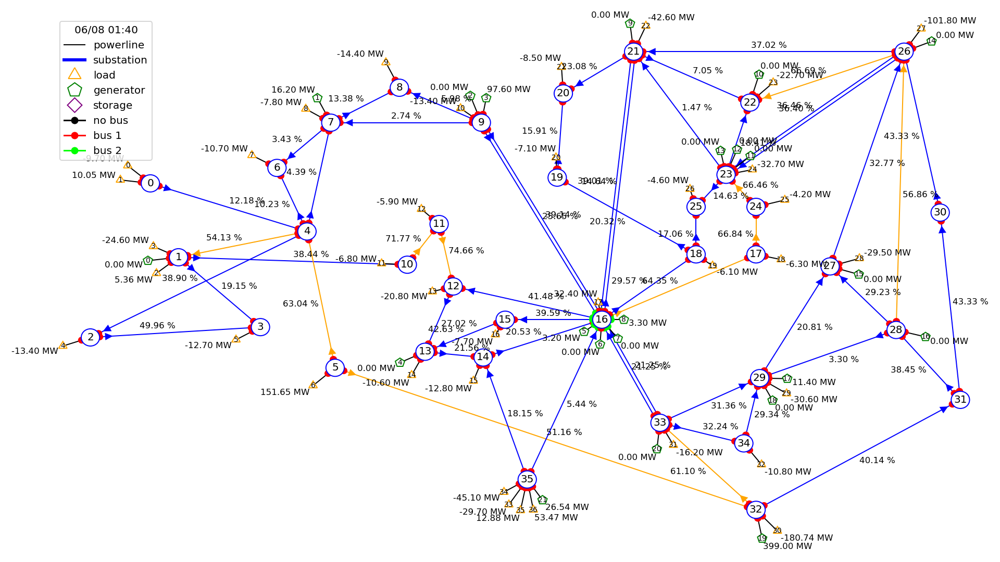

e:\masters\sem 2\analytics project\code\grid2op\grid2op\Episode\EpisodeReplay.py:202: UserWarning: Failed to optimize .GIF size, but gif is still saved:
Install dependencies to reduce size by ~3 folds
apt-get install gifsicle && pip3 install pygifsicle
  warnings.warn(warn_msg)


<IPython.core.display.Javascript object>


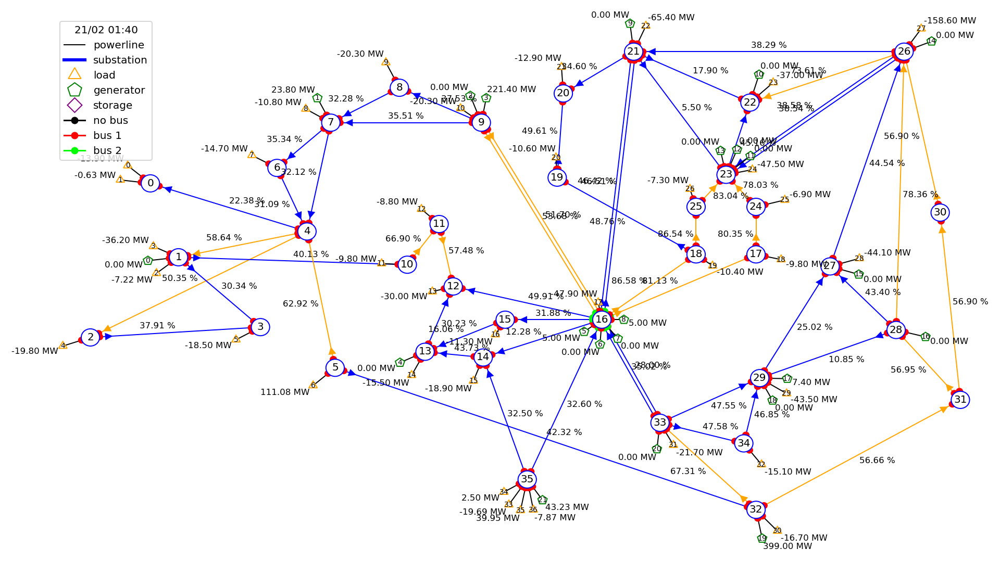

<IPython.core.display.Javascript object>


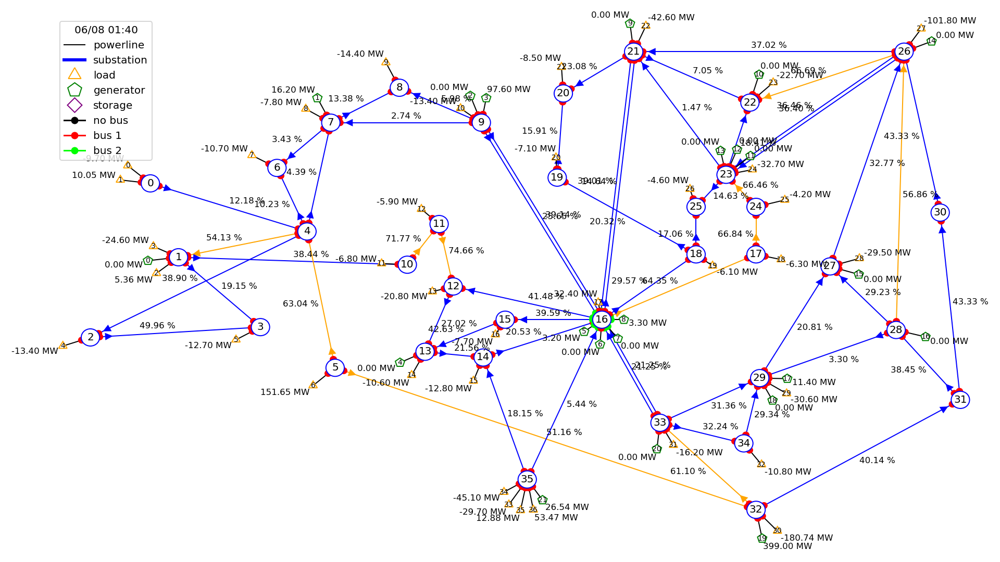

<IPython.core.display.Javascript object>


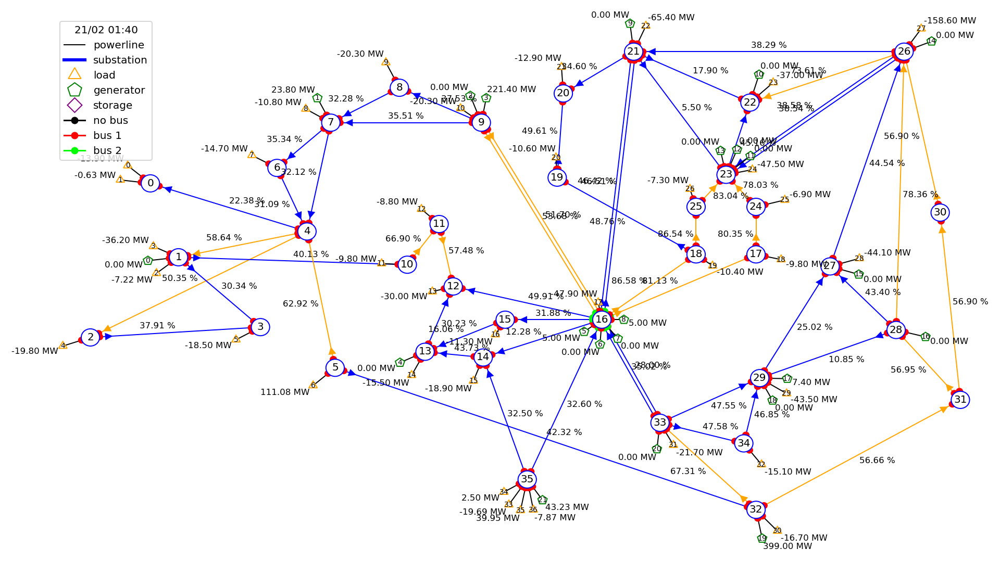

<IPython.core.display.Javascript object>


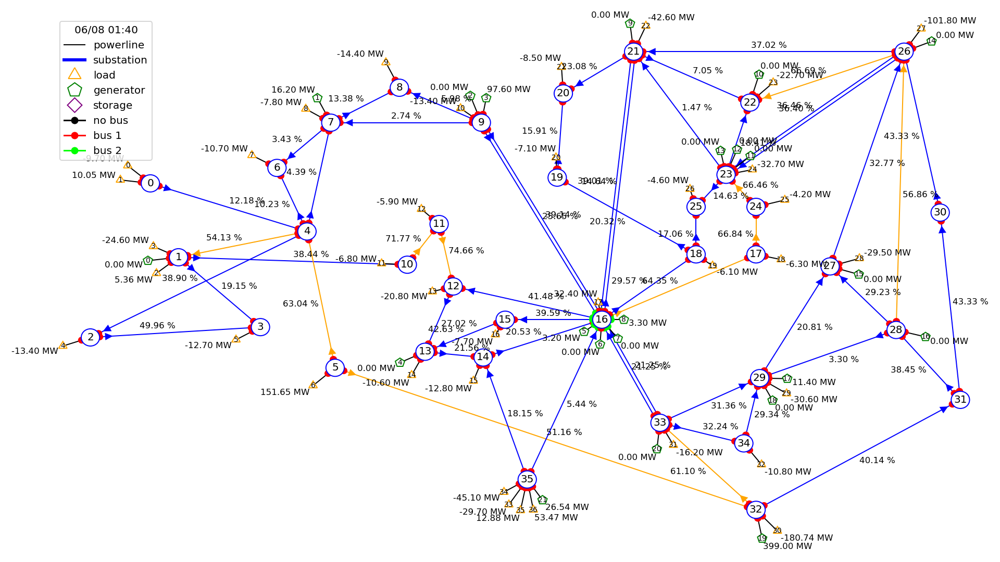

<IPython.core.display.Javascript object>


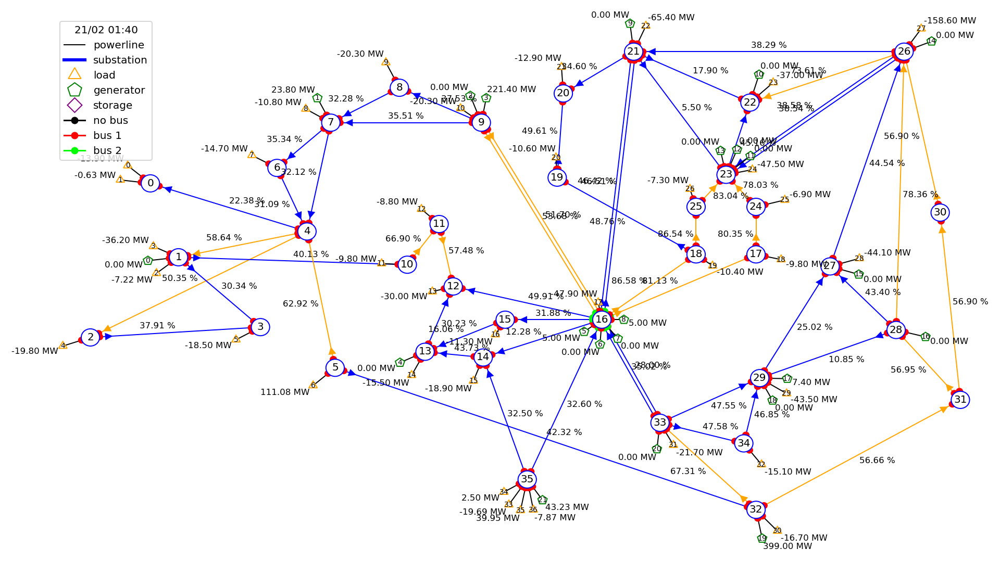

<IPython.core.display.Javascript object>


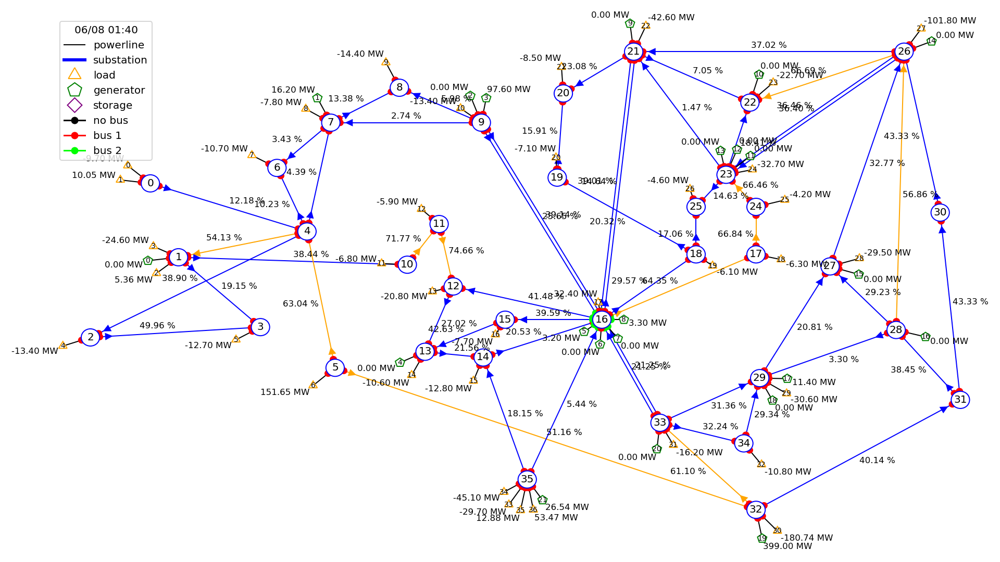

<IPython.core.display.Javascript object>


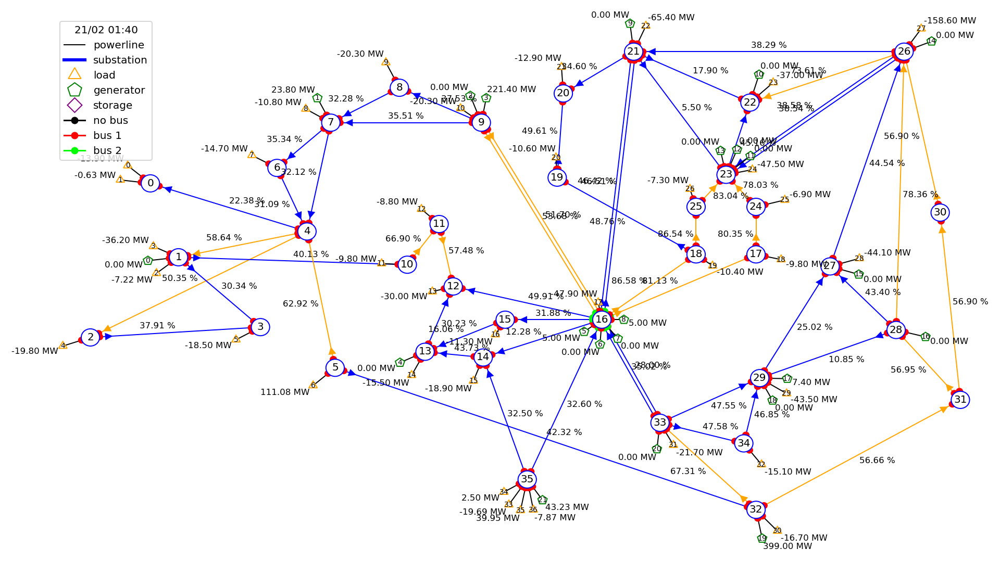

<IPython.core.display.Javascript object>


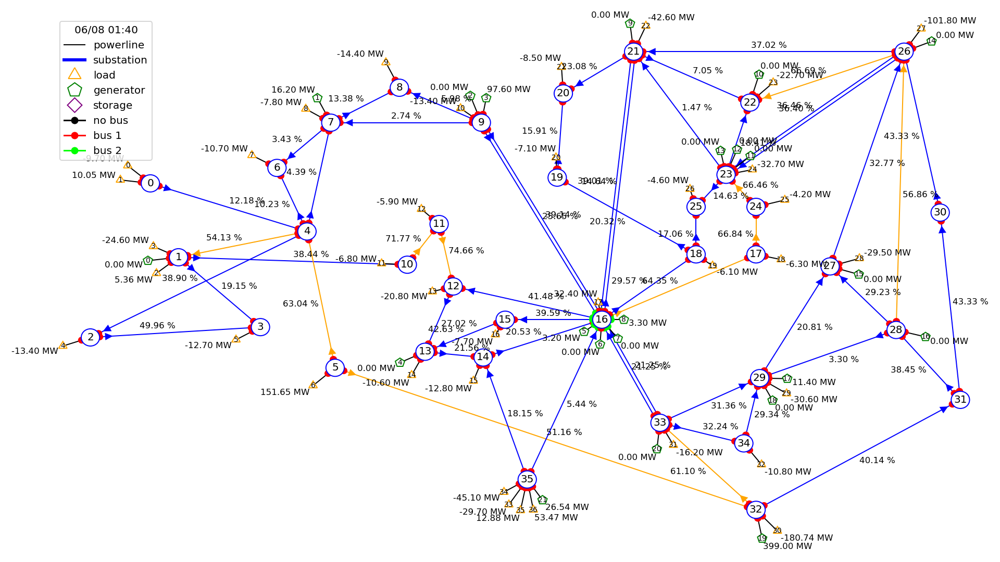

<IPython.core.display.Javascript object>


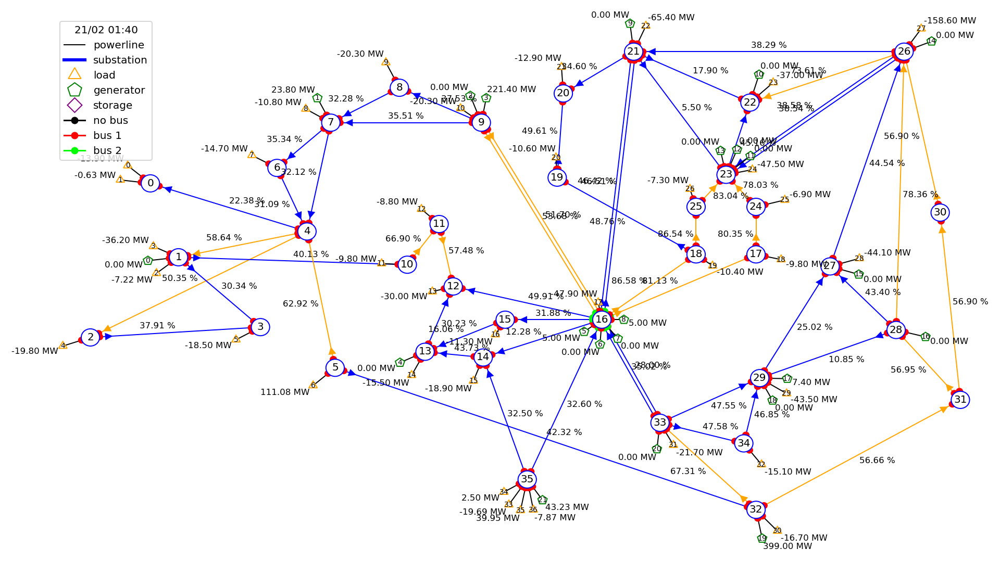

<IPython.core.display.Javascript object>


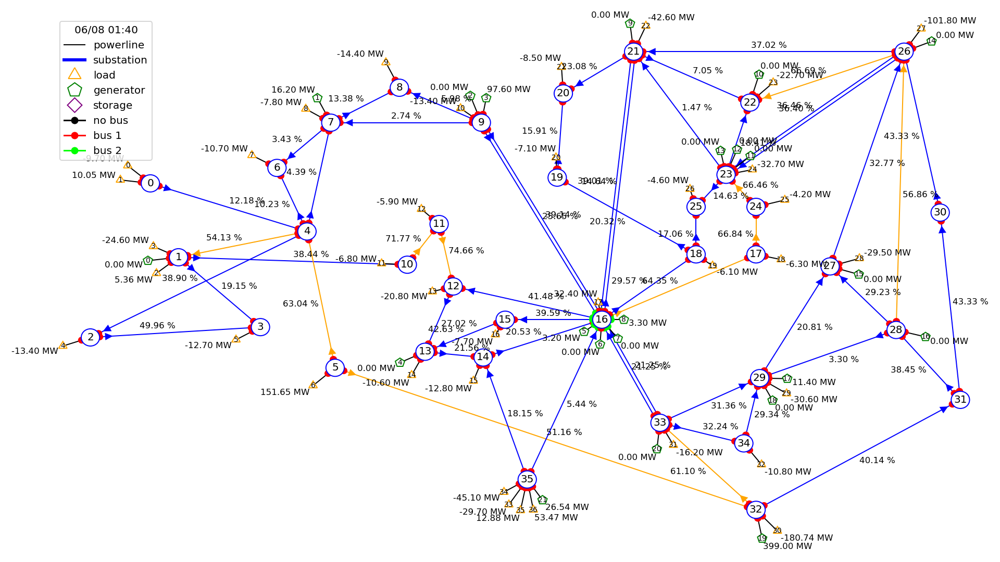

<IPython.core.display.Javascript object>


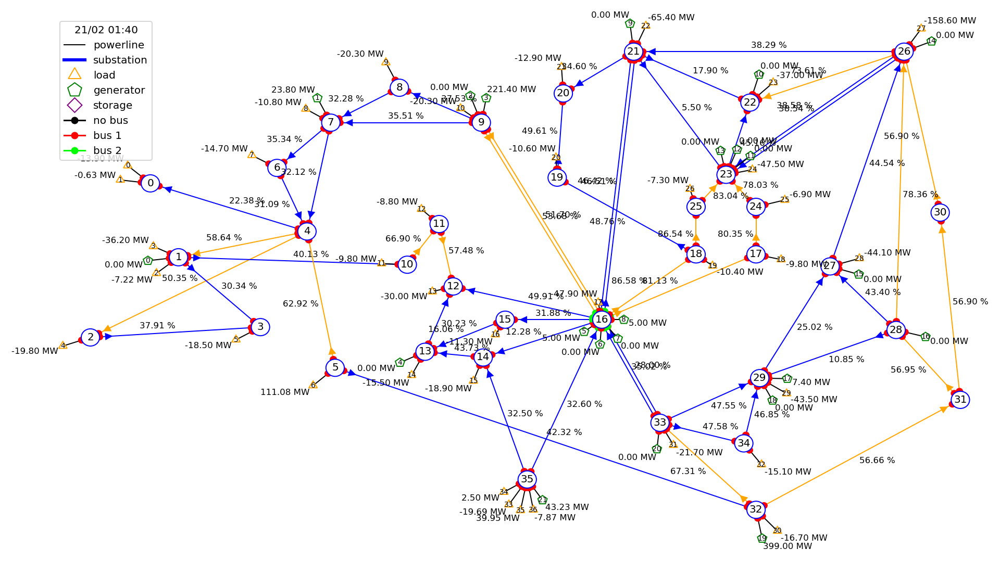

<IPython.core.display.Javascript object>


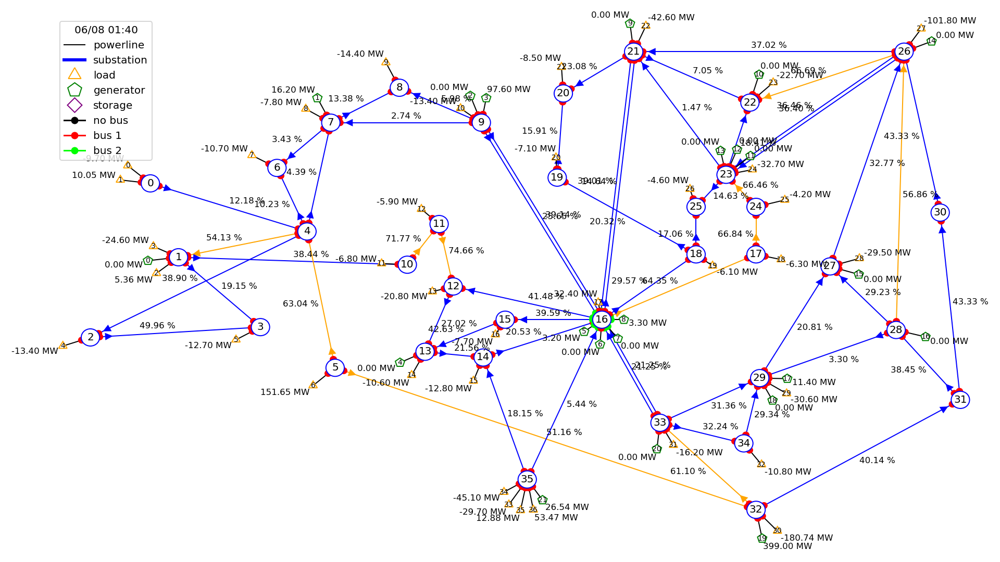

<IPython.core.display.Javascript object>


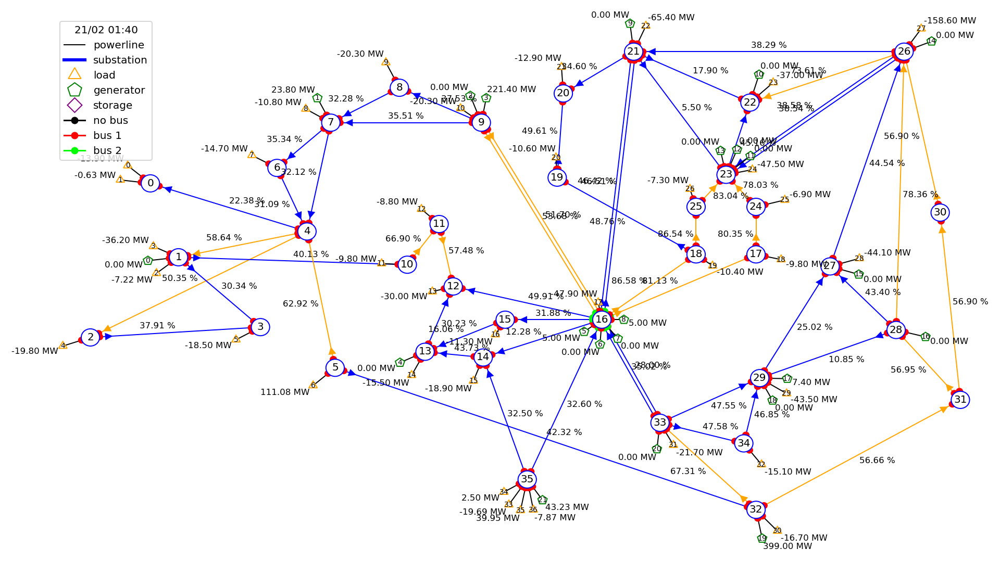

<IPython.core.display.Javascript object>


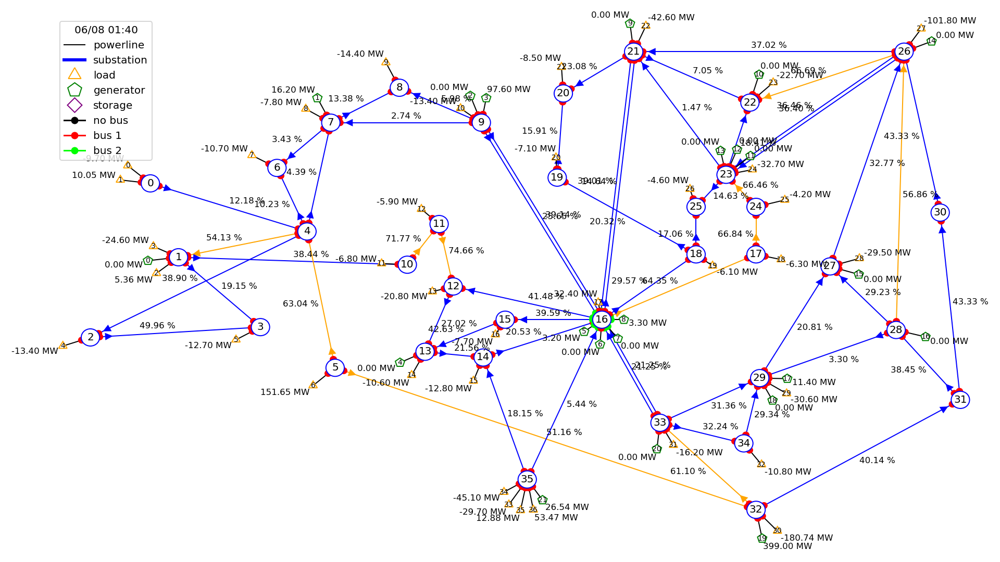

<IPython.core.display.Javascript object>


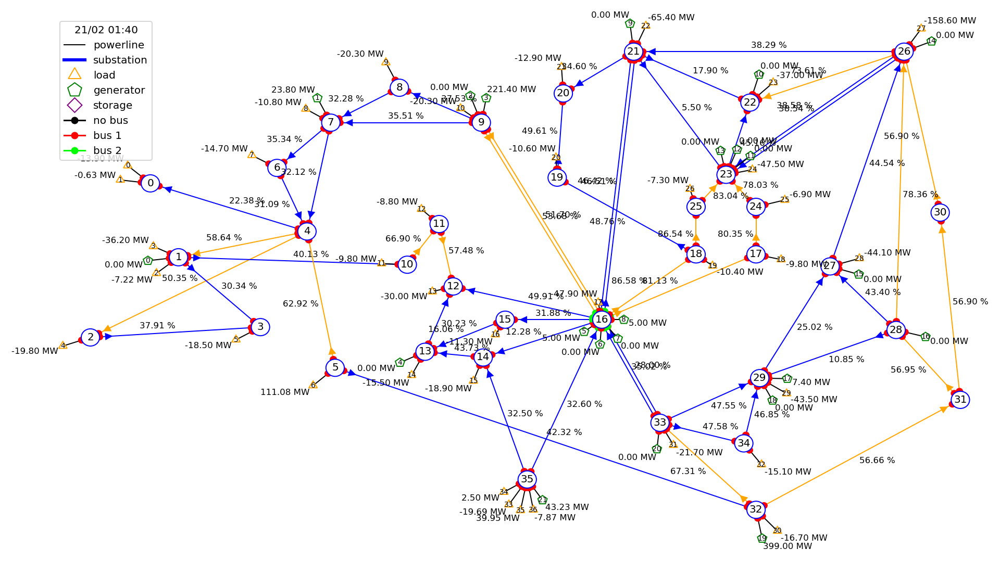

<IPython.core.display.Javascript object>


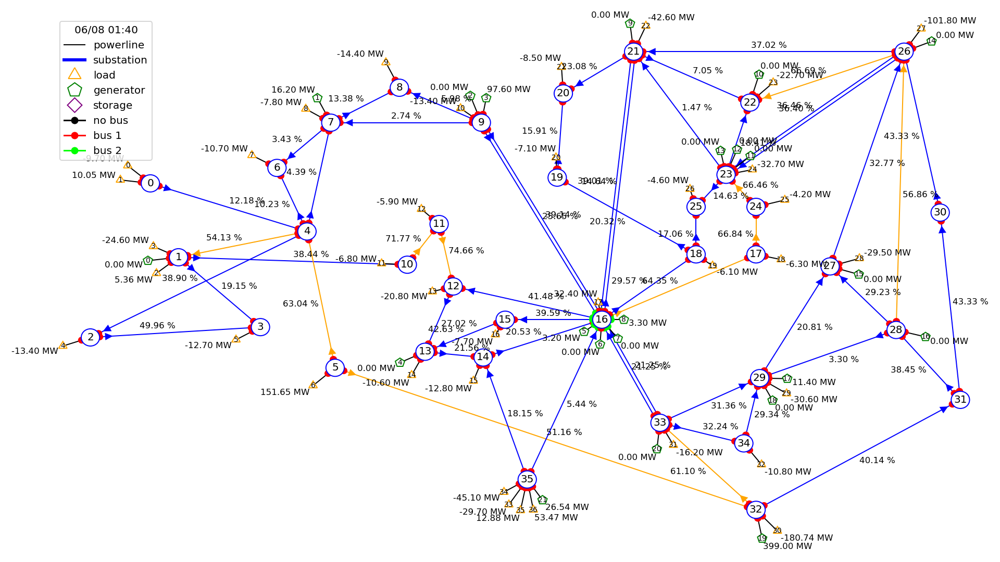

<IPython.core.display.Javascript object>


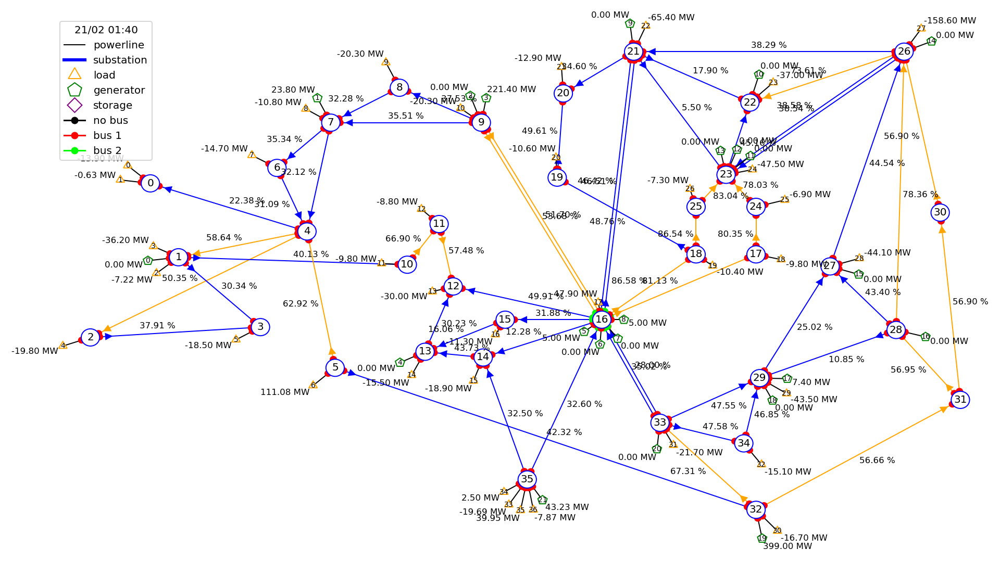

<IPython.core.display.Javascript object>


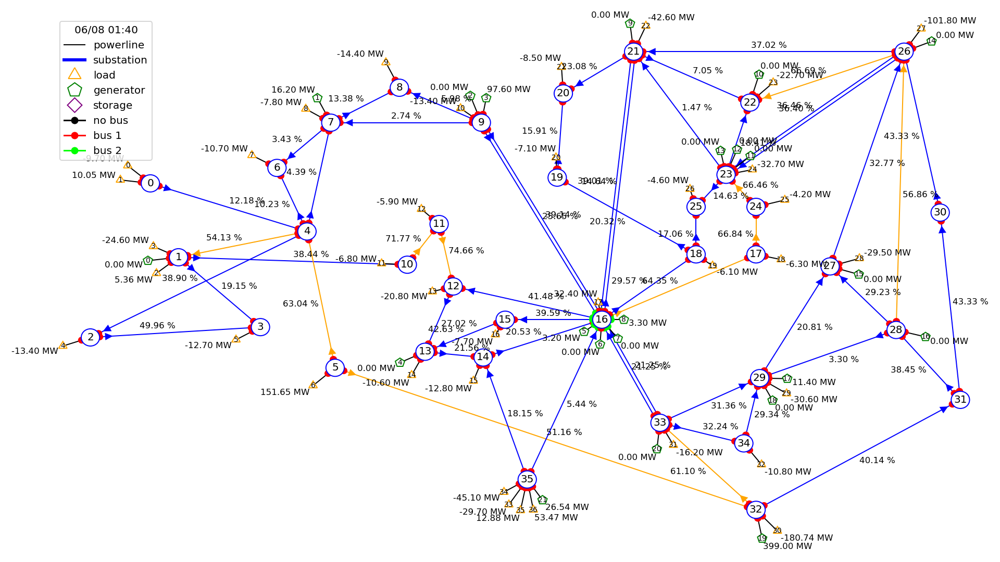

<IPython.core.display.Javascript object>


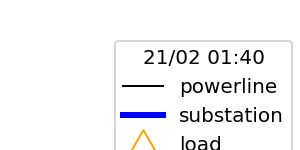

e:\masters\sem 2\analytics project\code\grid2op\grid2op\PlotGrid\PlotMatplot.py:305: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(w_inch, h_inch), dpi=self.dpi)


<IPython.core.display.Javascript object>


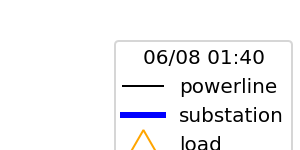

<IPython.core.display.Javascript object>


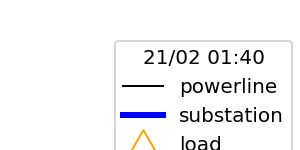

<IPython.core.display.Javascript object>


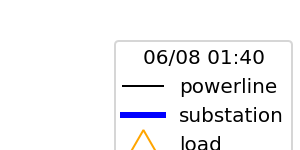

<IPython.core.display.Javascript object>


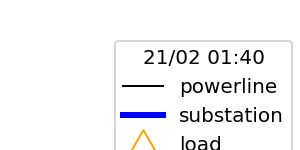

<IPython.core.display.Javascript object>


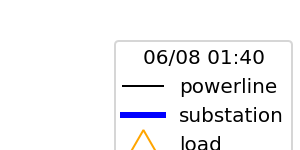

<IPython.core.display.Javascript object>


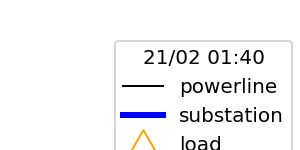

<IPython.core.display.Javascript object>


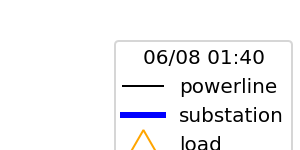

<IPython.core.display.Javascript object>


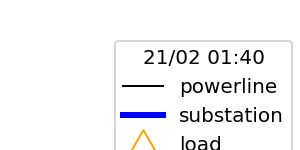

<IPython.core.display.Javascript object>


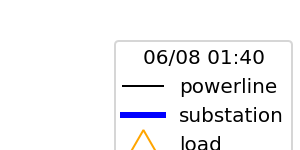

<IPython.core.display.Javascript object>


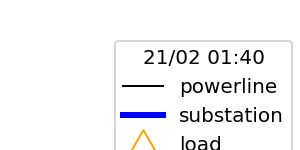

<IPython.core.display.Javascript object>


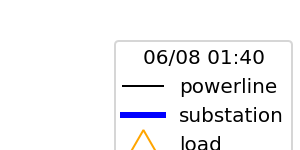

<IPython.core.display.Javascript object>


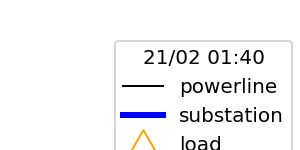

<IPython.core.display.Javascript object>


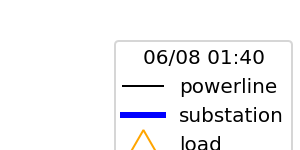

<IPython.core.display.Javascript object>


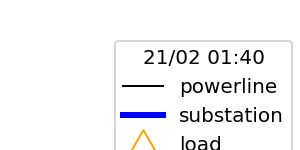

<IPython.core.display.Javascript object>


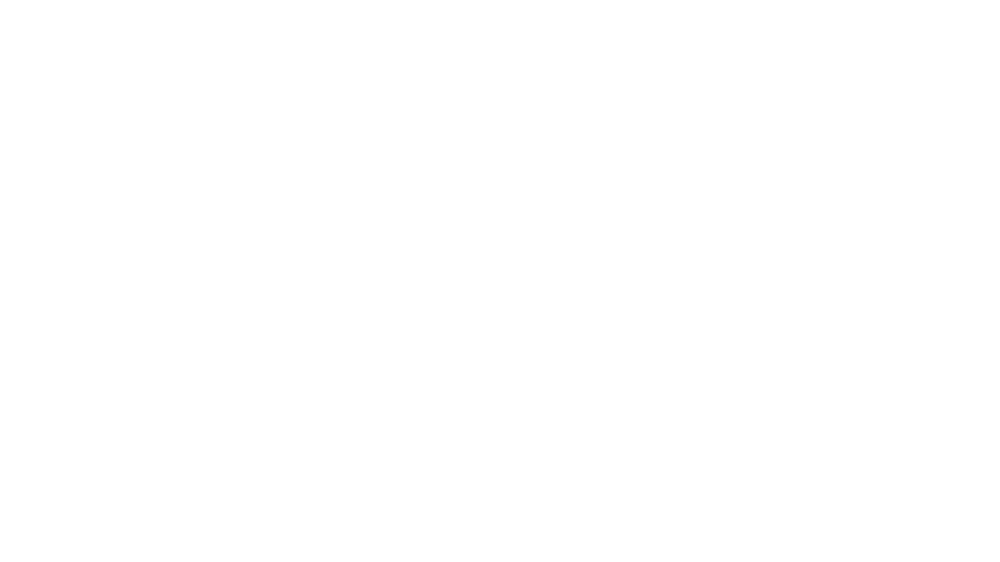

In [10]:
from grid2op.Episode import EpisodeReplay
gif_name = "episode"   
ep_replay = EpisodeReplay(agent_path=path_saved_data)
for _, chron_name, cum_reward, nb_time_step, max_ts in res:
    ep_replay.replay_episode(chron_name,  # which chronic was started
                             gif_name=gif_name, # Name of the gif file
                             display=False,  # dont wait before rendering each frames
                             fps=3.0)  # limit to 3 frames per second